# Causal Trees/Forests Treatment Effects Estimation and Tree Visualization: Multiple treatment groups

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

This notebook extends the applcation of causal trees and causal forests into multiple treatment groups setting.

Notes:
* __CausalTreeRegressor__ and __CausalRandomForestRegressor__ treat group 0 as a control one.
* Models predict individual treatment effects for all available groups starting from group 1. The __output is an array of estimated effects__ (samples x N_treatment groups})
* You can also return conditional outcomes along with individual treatment effects (pass with_outcomes=True into predict() method)

In [2]:
import pandas as pd
import numpy as np
import multiprocessing as mp
from collections import defaultdict

np.random.seed(42)

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor

import causalml
from causalml.metrics import plot_gain, plot_qini, qini_score
from causalml.dataset import synthetic_data
from causalml.inference.tree import plot_dist_tree_leaves_values, get_tree_leaves_mask
from causalml.inference.meta import BaseSRegressor, BaseXRegressor, BaseTRegressor, BaseDRRegressor
from causalml.inference.tree import CausalRandomForestRegressor
from causalml.inference.tree import CausalTreeRegressor
from causalml.inference.tree.plot import plot_causal_tree

import matplotlib.pyplot as plt
import seaborn as sns

%config InlineBackend.figure_format = 'retina'

Failed to import duecredit due to No module named 'duecredit'


In [3]:
import importlib
print(importlib.metadata.version('causalml') )

0.15.5


In [4]:
# Create dataset with multiple treatment groups
n=15000
data = []
sigmas = [5.5, 9]
n_treatments = 2
for i in range(n_treatments):
    _, X, w, tau, b, e = synthetic_data(mode=2, n=n, p=20, sigma=sigmas[i])
    w = np.where(w==1, i+1, 0)
    y = b + (w - 0.5) * tau + sigmas[i] * np.random.normal(size=15000)
    data.append([y, X, w, tau, b, e])

y = np.hstack([chunk[0] for chunk in data])
X = np.vstack([chunk[1] for chunk in data])
w = np.hstack([chunk[2] for chunk in data])
tau = np.hstack([chunk[3] for chunk in data])
b = np.hstack([chunk[4] for chunk in data])
e = np.hstack([chunk[5] for chunk in data])

In [5]:
df = pd.DataFrame(X)
feature_names = [f'feature_{i}' for i in range(X.shape[1])]
df.columns = feature_names
df['outcome'] = y
df['group'] = w
df['treatment_effect'] = tau
df = df.sample(frac=1.0).reset_index(drop=True)

# Balance the number pf observations per treatment
df_balanced = pd.concat(
    [
        df[df["group"]!=0], 
        df[df["group"]==0].sample(frac=0.5)
    ]
).sample(frac=1.).reset_index(drop=True)

In [6]:
df_balanced.head(10)

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,outcome,group,treatment_effect
0,-1.843752,-0.416445,-0.435220,1.136519,-0.444646,0.910687,-1.550397,0.006145,-1.060699,-0.232088,...,0.812587,0.380378,-0.957933,-0.414514,-0.222388,0.953906,0.249397,26.075187,2,-1.337303
1,0.371847,-0.312258,-0.160034,0.504142,-1.722580,-2.419144,-1.174724,0.894123,-0.234424,1.843962,...,-0.408764,-1.572036,0.490693,-0.967393,2.164168,2.026408,-1.135324,5.254008,2,0.921004
2,1.400706,0.365869,-0.853724,1.767198,1.059243,-1.480844,-1.756794,-1.425431,-0.493668,0.901783,...,2.371308,0.033988,-0.086985,-0.507579,2.211993,0.720900,-1.034488,4.384721,1,2.293428
3,-1.094371,0.571022,-0.860185,1.033432,0.961419,-0.595245,-0.830673,-1.201768,-1.298910,1.628336,...,1.153778,1.024785,0.668701,1.041092,-2.353774,-0.130593,-0.685925,0.680821,1,-0.075496
4,0.449353,-0.465032,-0.445610,-0.566312,1.469290,0.045352,0.197740,-0.619390,-0.029639,-0.975689,...,-0.734952,0.948393,1.907294,0.001101,1.311615,0.751449,-1.432782,3.219265,1,0.936776
5,-0.950697,0.370030,1.310526,-0.858501,-0.683408,0.115265,3.446213,-0.447654,0.964048,-0.178530,...,0.849271,-0.869850,0.096344,-0.853759,-0.417635,-1.514434,2.318241,1.094152,1,-0.055517
6,-1.402343,0.293333,0.525101,-0.422972,-0.775889,-1.141680,-1.462239,0.000677,0.387060,-1.182401,...,0.306714,-0.201380,-1.527027,-2.007304,-0.077995,-1.041969,0.741433,5.273565,0,-0.551812
7,-1.083269,1.328396,0.556250,0.335349,0.105360,0.762333,-0.725339,-0.496074,0.510418,0.396997,...,-0.026716,0.273313,0.724971,-0.133510,2.327073,0.493360,-0.499285,12.589639,2,0.480122
8,-0.795674,-1.227396,-0.413329,-0.081129,-0.753024,0.379748,-0.221361,0.983139,0.374194,0.596532,...,1.317159,0.875286,-0.204609,-0.605521,0.102352,-0.286369,-0.704454,-0.090144,1,-0.538667
9,-0.171581,0.358498,1.995371,-1.287743,1.895884,-0.080048,-0.266473,-1.509231,-1.134889,0.724567,...,0.403623,1.679353,0.535529,-0.679614,0.197896,-0.459182,-1.486429,-6.069860,2,0.716795


In [7]:
# Look at the conversion rate and sample size in each group
df_balanced.pivot_table(
    values='outcome',
    index='group',
    aggfunc=[np.mean, np.size],
    margins=True
)

,mean,size
,outcome,outcome
group,,
0,0.965585,7476
1,1.794689,7498
2,2.627637,7549
All,1.798664,22523


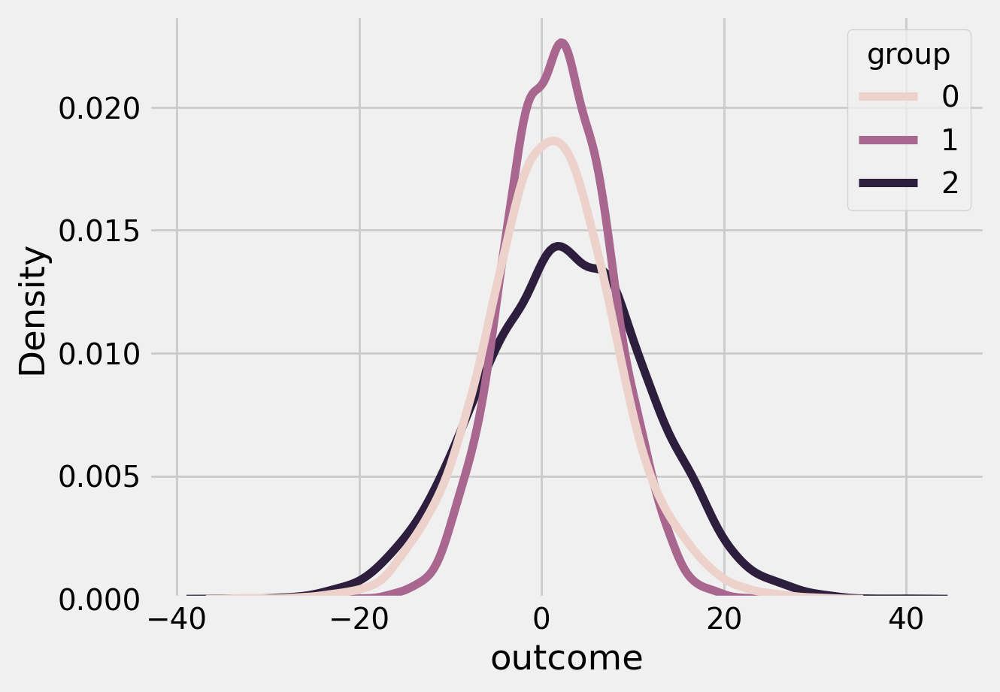

In [8]:
sns.kdeplot(data=df_balanced, x='outcome', hue='group')
plt.show()

In [9]:
# Split data to training and testing samples for model validation (next section)
df_train, df_test = train_test_split(df_balanced, test_size=0.2, random_state=11101)
n_test = df_test.shape[0]
n_train = df_train.shape[0]

In [10]:
# Table to gather estimated ITEs by models
df_result = pd.DataFrame({
    'outcome': df_test['outcome'],
    'group': df_test['group'],
    'treatment_effect': df_test['treatment_effect']
})

### CausalTreeRegressor

Available criteria for causal trees:

1. `standard_mse`: scikit-learn MSE where node values store $E_{node_i}(X|T=t)-E_{node_i}(X|T=0)$, treatment effects.

2. `causal_mse`: The criteria reward a partition for finding strong heterogeneity in treatment effects and penalize a partition that creates variance in leaf estimates.
* Article: [Athey, S., & Imbens, G. (2016). Recursive partitioning for heterogeneous causal effects](https://www.pnas.org/doi/10.1073/pnas.1510489113)

4. `ttest`: TTest impurity criteria.
* Article: [Su, Xiaogang, et al. (2009). Subgroup analysis via recursive partitioning.](https://www.jmlr.org/papers/v10/su09a.html)

In [11]:
ctrees = {
    'ctree_mse': {
        'params':
        dict(criterion='standard_mse',
             control_name=0,
             min_impurity_decrease=0,
             min_samples_leaf=400,
             groups_penalty=0.,
             groups_cnt=True),
    },
    'ctree_cmse': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.,
            groups_cnt=True,
        ),
    },
    'ctree_cmse_p=0.1': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.1,
            groups_cnt=True,
        ),
    },
    'ctree_cmse_p=0.25': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.25,
            groups_cnt=True,
        ),
    },
    'ctree_cmse_p=0.5': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.5,
            groups_cnt=True,
        ),
    },
    'ctree_ttest': {
        'params':
        dict(criterion='t_test',
             control_name=0,
             min_samples_leaf=400,
             groups_penalty=0.,
             groups_cnt=True),
    },
}


In [12]:
# Model treatment effect
for ctree_name, ctree_info in ctrees.items():
    print(f"Fitting: {ctree_name}")
    ctree = CausalTreeRegressor(**ctree_info['params'])
    ctree.fit(X=df_train[feature_names].values,
              y=df_train['outcome'].values,
              treatment=df_train['group'].values,
             )
    
    ctrees[ctree_name].update({'model': ctree})
    
    for tr_group in range(n_treatments):
        ite_preds = ctree.predict(df_test[feature_names].values)
        df_result[f"{ctree_name}_t={tr_group + 1}"] = ite_preds[:, tr_group]

Fitting: ctree_mse
Fitting: ctree_cmse
Fitting: ctree_cmse_p=0.1
Fitting: ctree_cmse_p=0.25
Fitting: ctree_cmse_p=0.5
Fitting: ctree_ttest


In [13]:
df_result.head()

,outcome,group,treatment_effect,ctree_mse_t=1,ctree_mse_t=2,ctree_cmse_t=1,ctree_cmse_t=2,ctree_cmse_p=0.1_t=1,ctree_cmse_p=0.1_t=2,ctree_cmse_p=0.25_t=1,ctree_cmse_p=0.25_t=2,ctree_cmse_p=0.5_t=1,ctree_cmse_p=0.5_t=2,ctree_ttest_t=1,ctree_ttest_t=2
7141,10.646692,2,2.437867,2.321658,4.596306,2.805982,5.476028,2.228113,2.888143,2.316575,2.961845,2.023873,4.400219,2.241755,5.773159
21493,9.975317,1,-0.355883,0.018806,0.797210,0.165480,1.669553,1.703463,2.071175,0.925412,0.851897,-0.916406,-0.209149,0.165480,1.669553
14468,-1.451720,0,1.038951,-0.491156,0.757497,2.537490,4.750936,0.540594,1.747176,0.810170,2.018340,2.557676,0.793932,1.844630,3.204809
15949,8.436989,2,-0.227129,-1.388618,-0.858494,-0.805137,-3.255744,-0.448149,-0.276480,0.097168,1.307484,0.245317,0.237984,-0.729454,-3.027669
4463,11.430793,1,1.390515,1.709099,1.829913,1.162215,1.636576,0.804862,2.145609,0.331659,1.618327,2.579005,4.864636,2.083858,1.941733


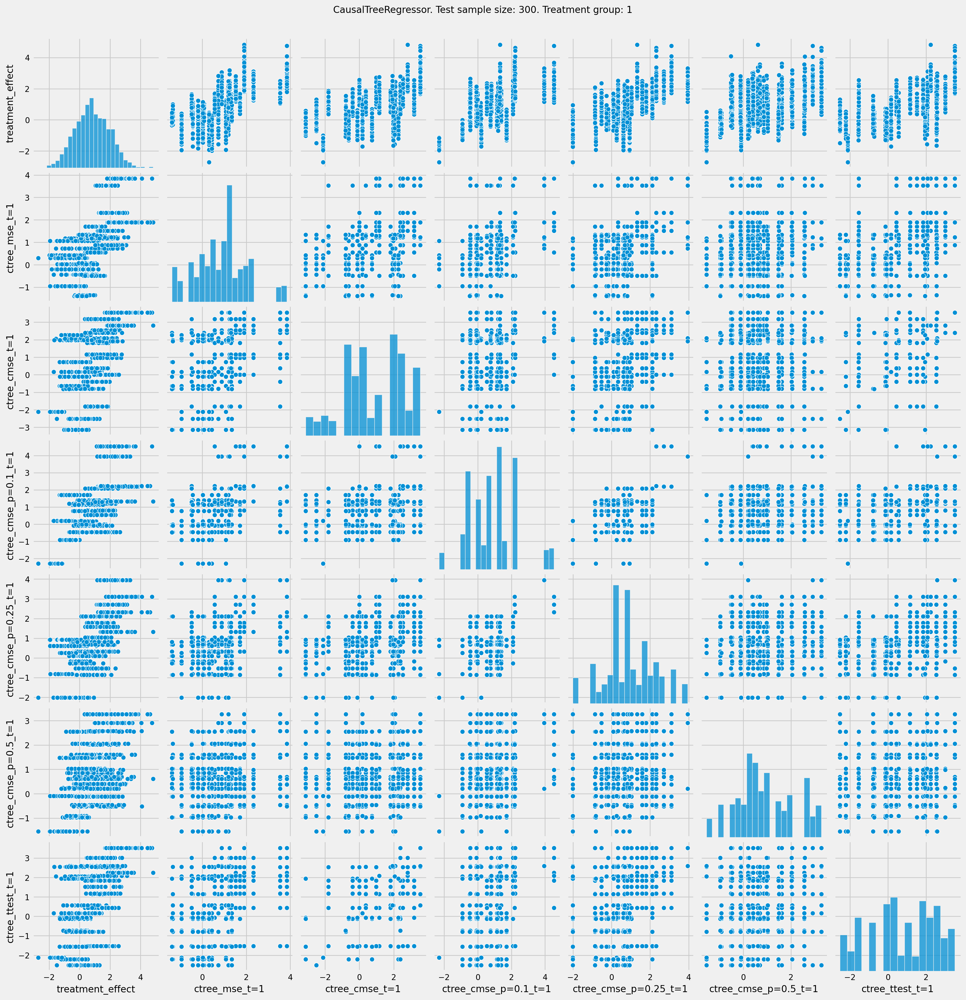

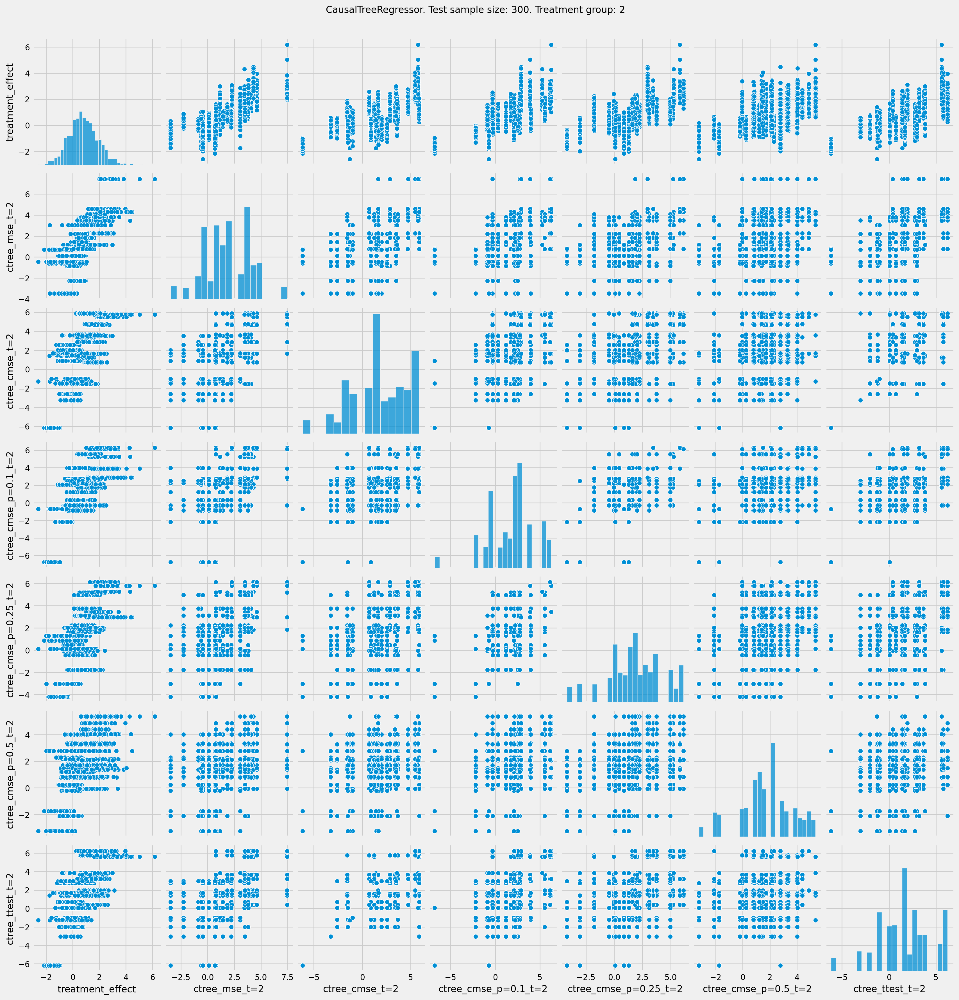

In [14]:
# See treatment effect estimation with CausalTreeRegressor vs true treatment effect within each treatment group
n_obs = 300

indxs = df_result.index.values
np.random.shuffle(indxs)
indxs = indxs[:n_obs]

for group in range(1, n_treatments + 1):
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in ctrees.keys()]
    plt.rcParams.update({'font.size': 10})
    pairplot = sns.pairplot(df_result[df_result["group"]==group][['treatment_effect', *ite_pred_cols_per_group] ])
    pairplot.fig.suptitle(f"CausalTreeRegressor. Test sample size: {n_obs}. Treatment group: {group}" , y=1.02)
    plt.show()

#### Plot the Qini chart

Text(0.5, 0.98, 'Qini charts for treatment groups')

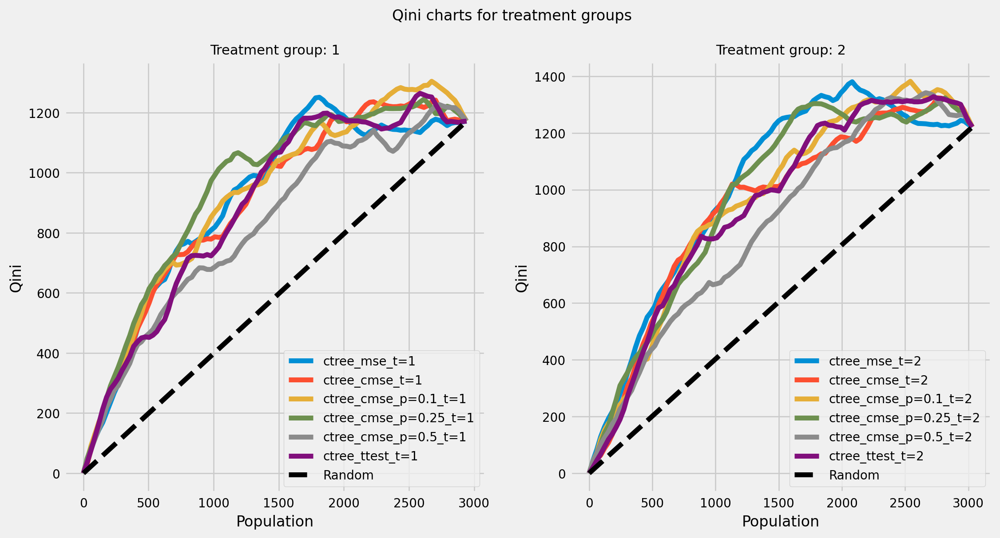

In [15]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in ctrees.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_qini(df_group_result,
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              ax=axes[i]
    )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)
    
plt.suptitle("Qini charts for treatment groups")

In [16]:
qini_scores = []

for i, group in enumerate(range(1, n_treatments + 1)):
    
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in ctrees.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    df_qini = qini_score(df_group_result,
               outcome_col='outcome',
               treatment_col='is_treated',
               treatment_effect_col='treatment_effect')
    df_qini = df_qini.reset_index()
    df_qini.columns = ["model", "qini_score"]
    df_qini["group"] = group
    qini_scores.append(df_qini)

In [17]:
df_all_qini_scores = pd.concat(qini_scores, axis=0).sort_values(by=["qini_score"], ascending=False)
df_all_qini_scores

,model,qini_score,group
0,ctree_mse_t=2,0.321623,2
3,ctree_cmse_p=0.25_t=1,0.308578,1
3,ctree_cmse_p=0.25_t=2,0.295315,2
2,ctree_cmse_p=0.1_t=1,0.286099,1
2,ctree_cmse_p=0.1_t=2,0.285538,2
0,ctree_mse_t=1,0.273335,1
1,ctree_cmse_t=2,0.271946,2
5,ctree_ttest_t=2,0.271025,2
1,ctree_cmse_t=1,0.268152,1
5,ctree_ttest_t=1,0.256744,1


#### The cumulative gain of the true treatment effect in each population

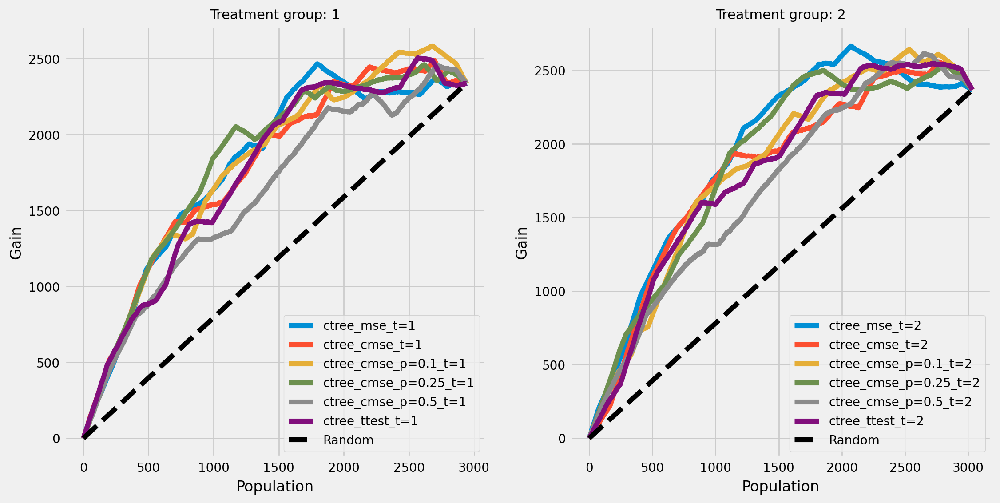

In [18]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in ctrees.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)

#### The cumulative difference between the mean outcomes of the treatment and control groups in each population

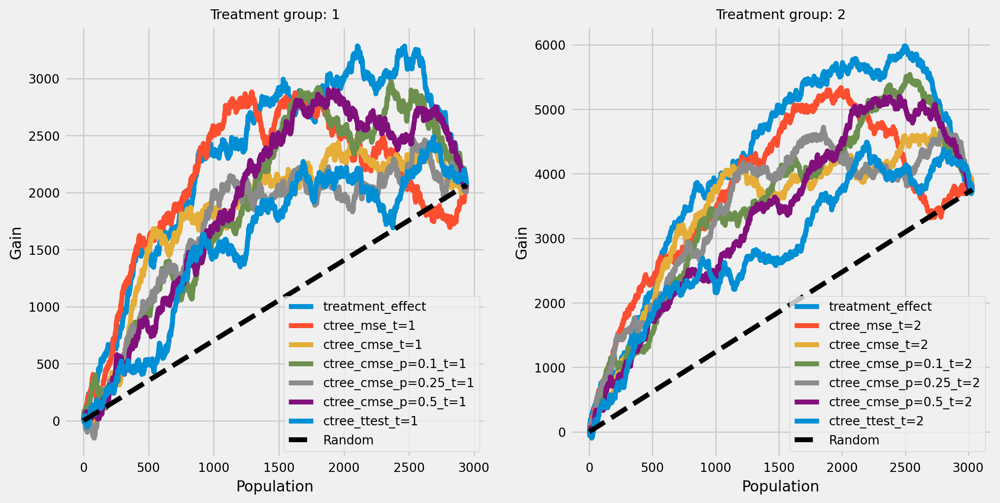

In [19]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in ctrees.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)

#### Plot trees with sklearn function and save as vector graphics

In [20]:
for ctree_name, ctree_info in ctrees.items():
    plt.figure(figsize=(20,20))
    plot_causal_tree(ctree_info['model'], 
                     feature_names = feature_names,
                     filled=True,
                     impurity=True,
                     proportion=False,
                     treatment_groups=sorted(df_balanced["group"].unique().tolist())
                    )
    plt.title(ctree_name)
    plt.savefig(f'{ctree_name}_{n_treatments}_treatments.svg')
    plt.close()

#### How values in leaves of the fitted trees differ from each other:

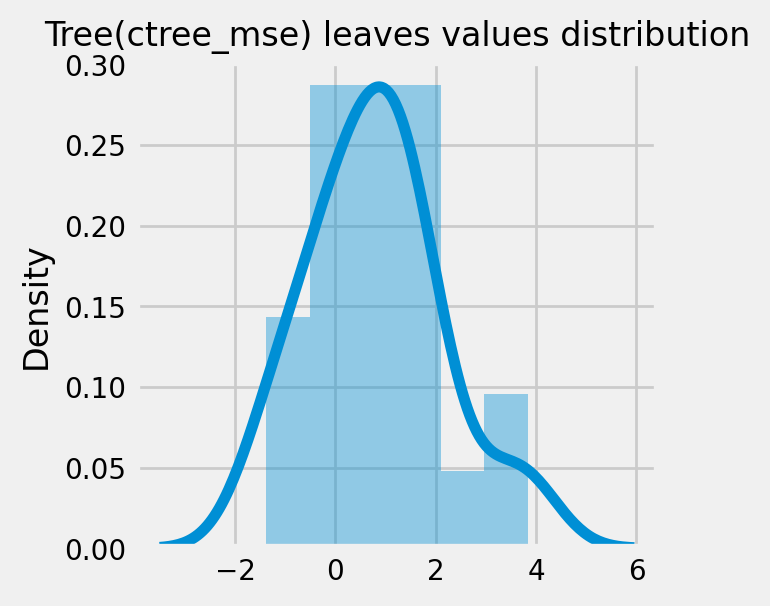

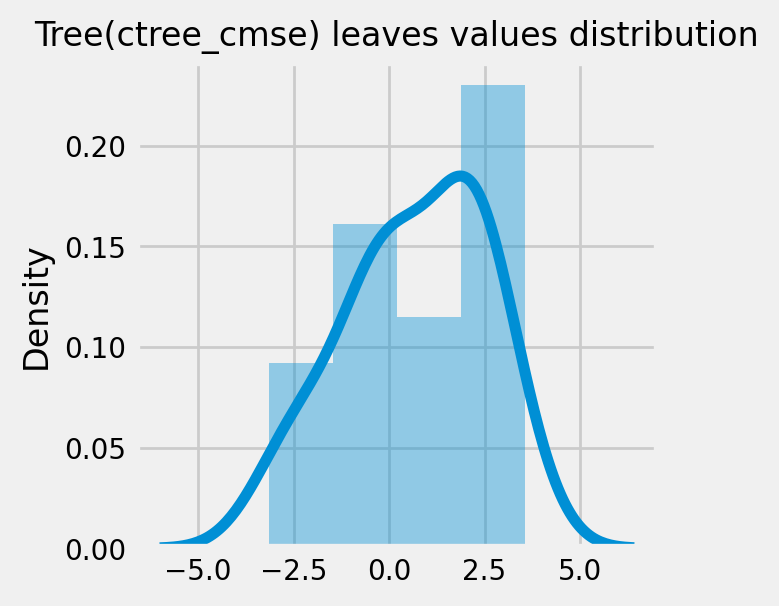

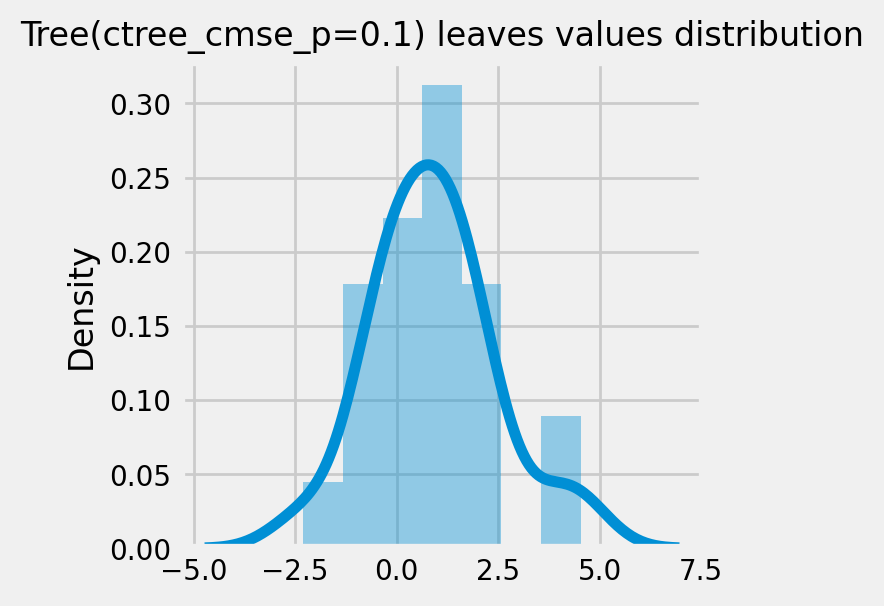

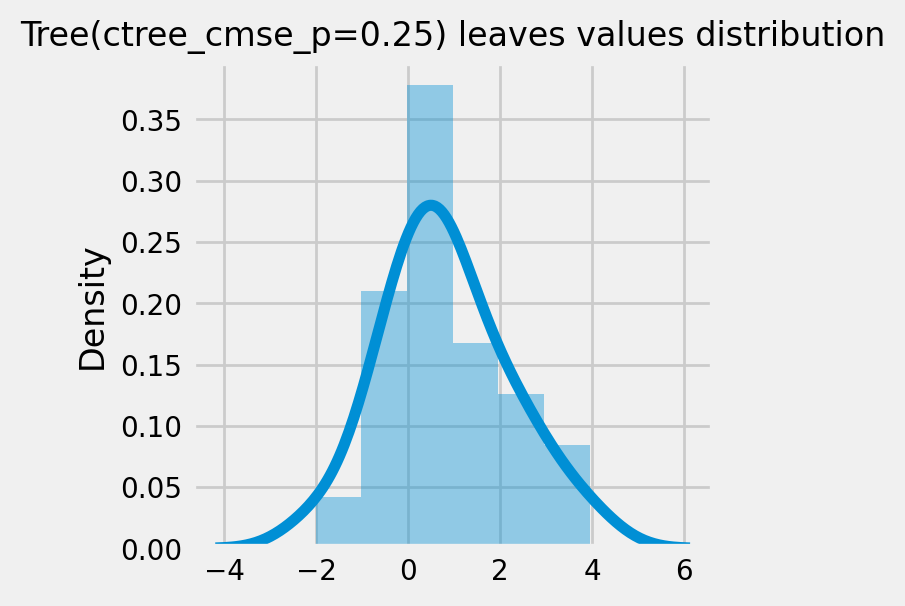

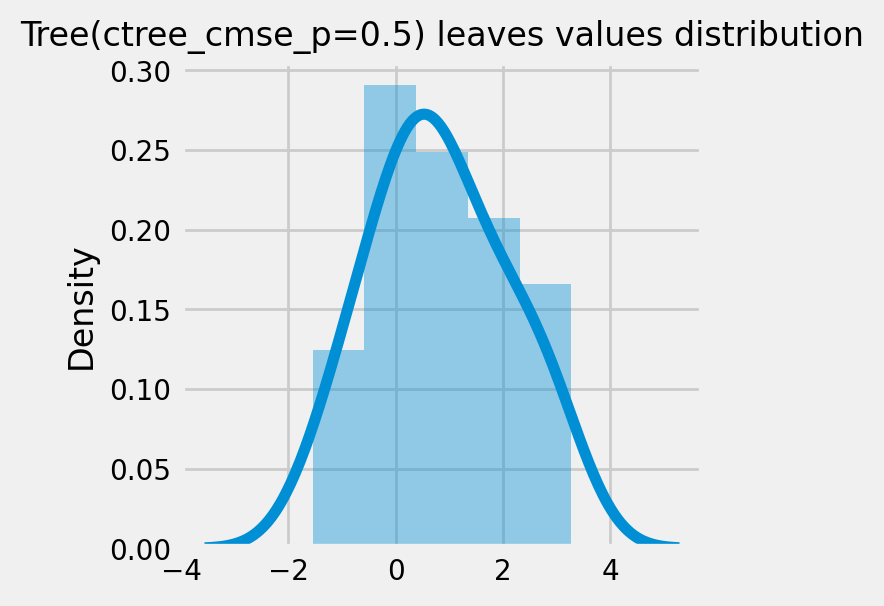

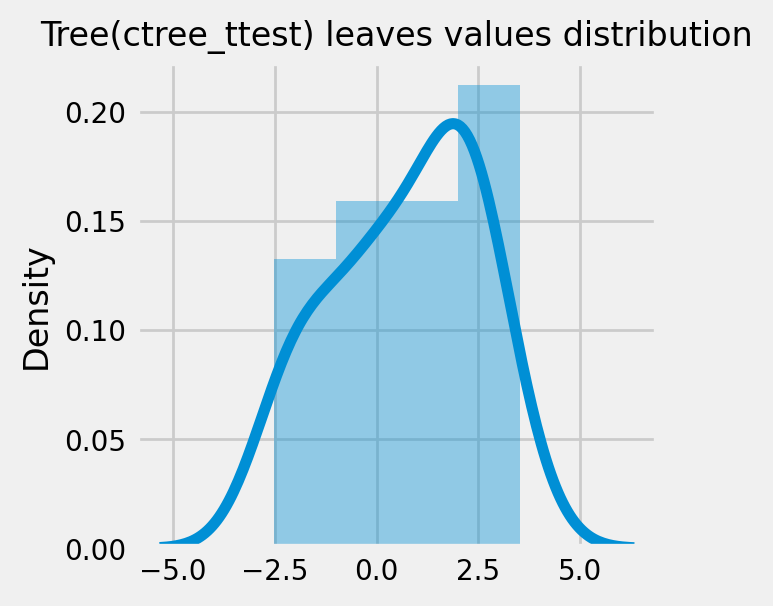

In [21]:
for ctree_name, ctree_info in ctrees.items():
    plot_dist_tree_leaves_values(ctree_info['model'], 
                                 figsize=(3,3),
                                 title=f'Tree({ctree_name}) leaves values distribution')

### CausalRandomForestRegressor 

In [22]:
cforests = {
    'cforest_mse': {
        'params':
        dict(criterion='standard_mse',
             control_name=0,
             min_impurity_decrease=0,
             min_samples_leaf=400,
             groups_penalty=0.,
             groups_cnt=True),
    },
    'cforest_cmse': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.,
            groups_cnt=True
        ),
    },
    'cforest_cmse_p=0.5': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            min_samples_leaf=400,
            groups_penalty=0.5,
            groups_cnt=True,
        ),
    },
    'cforest_cmse_p=0.5_md=3': {
        'params':
        dict(
            criterion='causal_mse',
            control_name=0,
            max_depth=3,
            min_samples_leaf=400,
            groups_penalty=0.5,
            groups_cnt=True,
        ),
    },
    'cforest_ttest': {
        'params':
        dict(criterion='t_test',
             control_name=0,
             min_samples_leaf=400,
             groups_penalty=0.,
             groups_cnt=True),
    },
}

In [23]:
# Model treatment effect
for cforest_name, cforest_info in cforests.items():
    print(f"Fitting: {cforest_name}")
    cforest = CausalRandomForestRegressor(**cforest_info['params'])
    cforest.fit(X=df_train[feature_names].values,
                y=df_train['outcome'].values,
                treatment=df_train['group'].values,
               )
    
    cforests[cforest_name].update({'model': cforest})

    for tr_group in range(n_treatments):
        ite_preds = cforest.predict(df_test[feature_names].values)
        df_result[f"{cforest_name}_t={tr_group + 1}"] = ite_preds[:, tr_group]

Fitting: cforest_mse
Fitting: cforest_cmse
Fitting: cforest_cmse_p=0.5
Fitting: cforest_cmse_p=0.5_md=3
Fitting: cforest_ttest


In [24]:
df_result.head()

,outcome,group,treatment_effect,ctree_mse_t=1,ctree_mse_t=2,ctree_cmse_t=1,ctree_cmse_t=2,ctree_cmse_p=0.1_t=1,ctree_cmse_p=0.1_t=2,ctree_cmse_p=0.25_t=1,...,cforest_mse_t=1,cforest_mse_t=2,cforest_cmse_t=1,cforest_cmse_t=2,cforest_cmse_p=0.5_t=1,cforest_cmse_p=0.5_t=2,cforest_cmse_p=0.5_md=3_t=1,cforest_cmse_p=0.5_md=3_t=2,cforest_ttest_t=1,cforest_ttest_t=2
7252,10.646692,2,2.437867,2.321658,4.596306,2.805982,5.476028,2.228113,2.888143,2.316575,...,3.224170,5.783897,4.135176,7.970124,3.515840,6.256412,3.064170,5.850108,4.368163,7.860408
19894,9.975317,1,-0.355883,0.018806,0.797210,0.165480,1.669553,1.703463,2.071175,0.925412,...,-0.154758,-0.452341,0.076247,0.048155,0.303238,0.668276,0.231469,0.445420,-0.021401,0.056482
18724,-1.451720,0,1.038951,-0.491156,0.757497,2.537490,4.750936,0.540594,1.747176,0.810170,...,1.287498,2.928469,2.919872,5.560846,2.129043,4.131323,2.304073,4.685080,3.349423,5.874551
8342,8.436989,2,-0.227129,-1.388618,-0.858494,-0.805137,-3.255744,-0.448149,-0.276480,0.097168,...,0.375448,0.799171,0.323876,0.410992,0.889639,1.520914,0.772961,1.890768,0.317772,0.328841
17412,11.430793,1,1.390515,1.709099,1.829913,1.162215,1.636576,0.804862,2.145609,0.331659,...,1.744141,4.481111,2.030247,5.200302,2.704911,5.718826,1.867622,4.031652,2.588643,5.785427


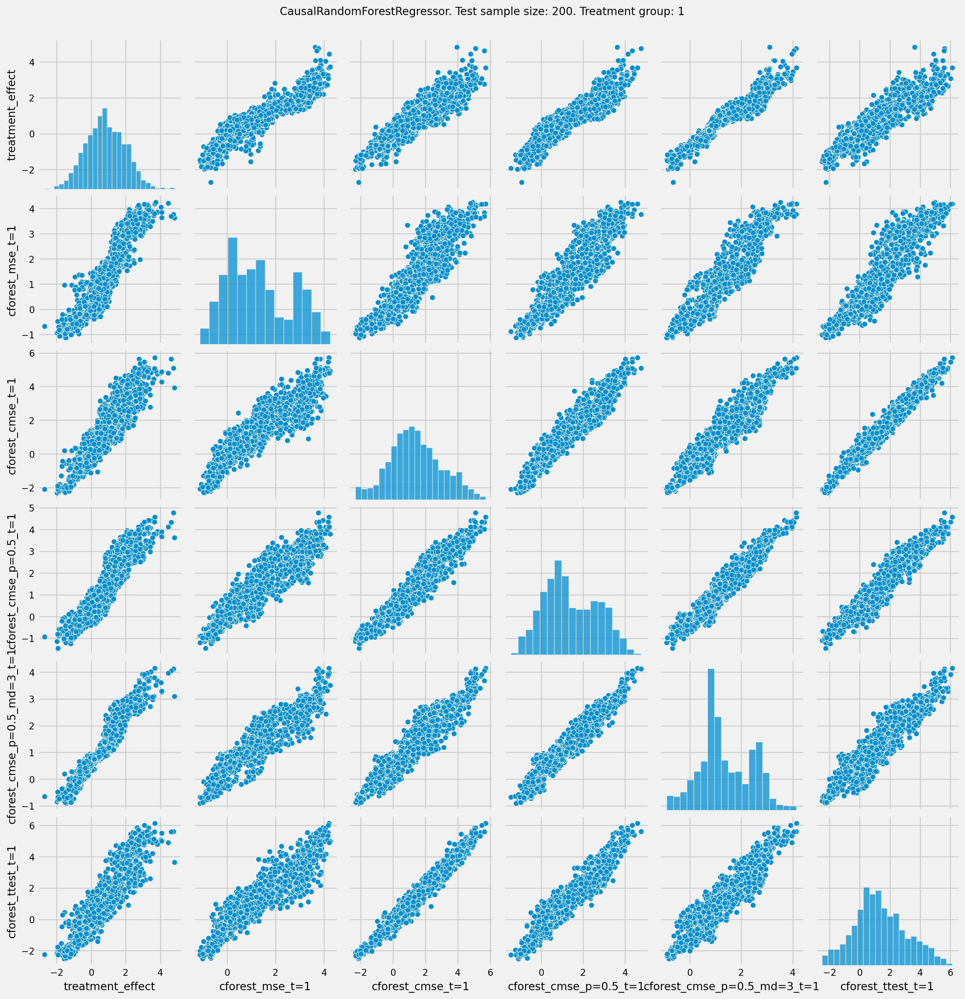

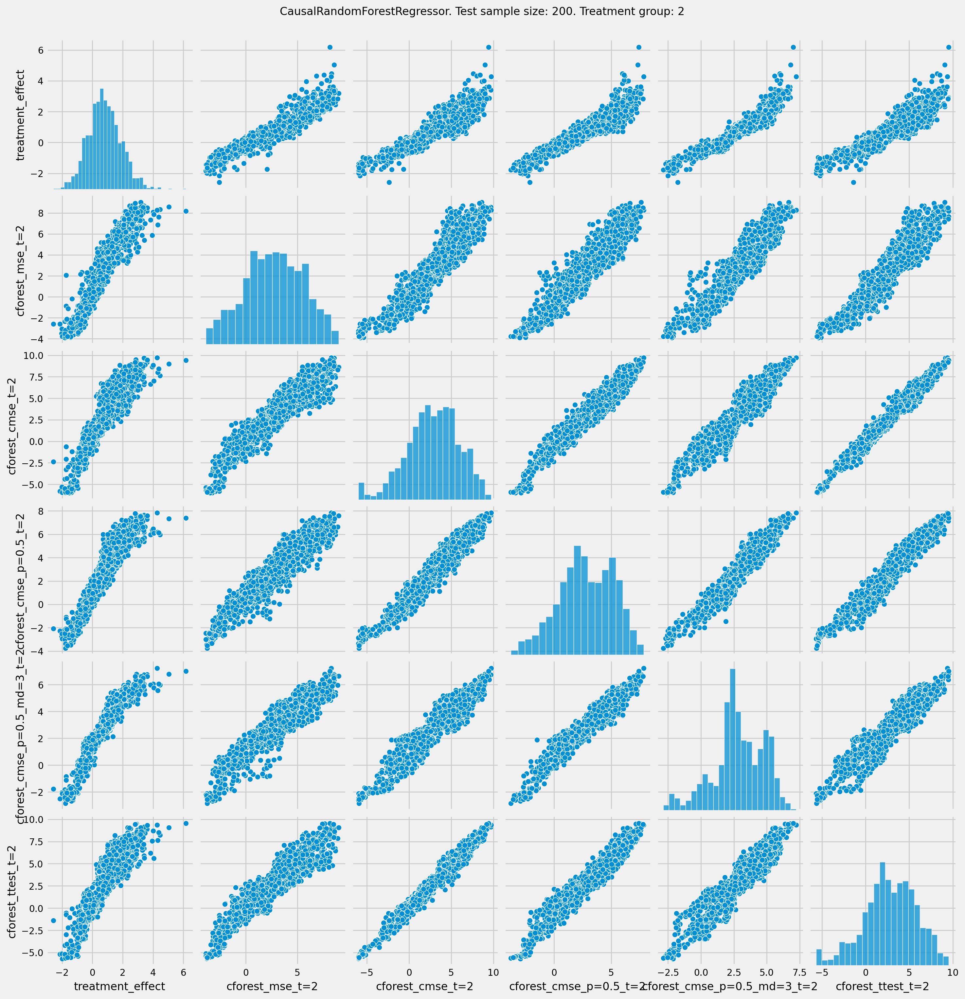

In [25]:
# See treatment effect estimation with CausalRandomForestRegressor vs true treatment effect 

n_obs = 200

indxs = df_result.index.values
np.random.shuffle(indxs)
indxs = indxs[:n_obs]

for group in range(1, n_treatments + 1):
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in cforests.keys()]
    plt.rcParams.update({'font.size': 10})
    pairplot = sns.pairplot(df_result[df_result["group"]==group][['treatment_effect', *ite_pred_cols_per_group] ])
    pairplot.fig.suptitle(f"CausalRandomForestRegressor. Test sample size: {n_obs}. Treatment group: {group}" , y=1.02)
    plt.show()

#### Qini chart

Text(0.5, 0.98, 'Qini charts for treatment groups')

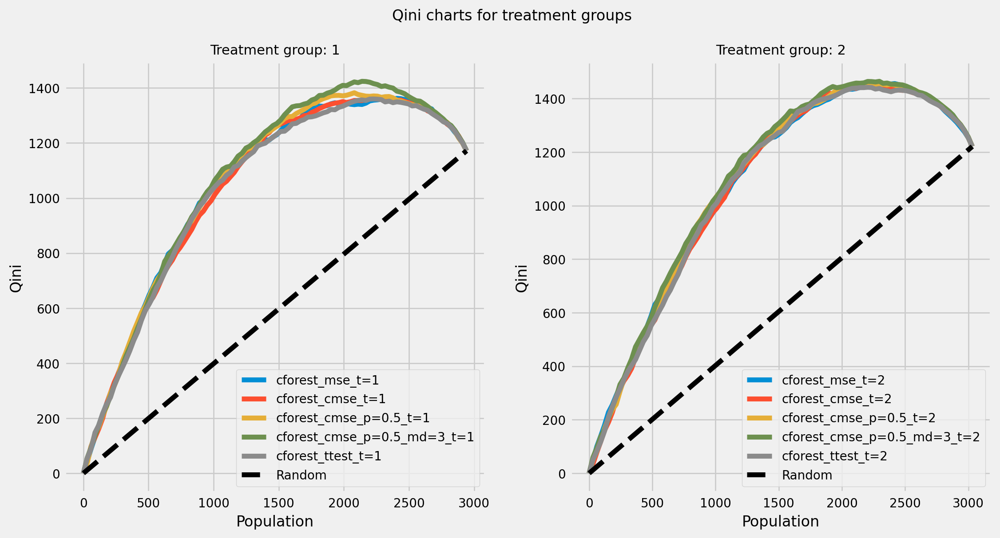

In [26]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in cforests.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_qini(df_group_result,
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              ax=axes[i]
    )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)
    
plt.suptitle("Qini charts for treatment groups")

In [27]:
qini_scores = []

for i, group in enumerate(range(1, n_treatments + 1)):
    
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in cforests.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    df_qini = qini_score(df_group_result,
               outcome_col='outcome',
               treatment_col='is_treated',
               treatment_effect_col='treatment_effect')
    df_qini = df_qini.reset_index()
    df_qini.columns = ["model", "qini_score"]
    df_qini["group"] = group
    qini_scores.append(df_qini)

In [28]:
df_all_qini_scores = pd.concat(qini_scores, axis=0).sort_values(by=["qini_score"], ascending=False)
df_all_qini_scores

,model,qini_score,group
3,cforest_cmse_p=0.5_md=3_t=1,0.409017,1
2,cforest_cmse_p=0.5_t=1,0.397801,1
3,cforest_cmse_p=0.5_md=3_t=2,0.396630,2
0,cforest_mse_t=1,0.392532,1
2,cforest_cmse_p=0.5_t=2,0.386826,2
1,cforest_cmse_t=1,0.384581,1
4,cforest_ttest_t=1,0.382704,1
0,cforest_mse_t=2,0.381829,2
4,cforest_ttest_t=2,0.377605,2
1,cforest_cmse_t=2,0.377068,2


#### The cumulative gain of the true treatment effect in each population

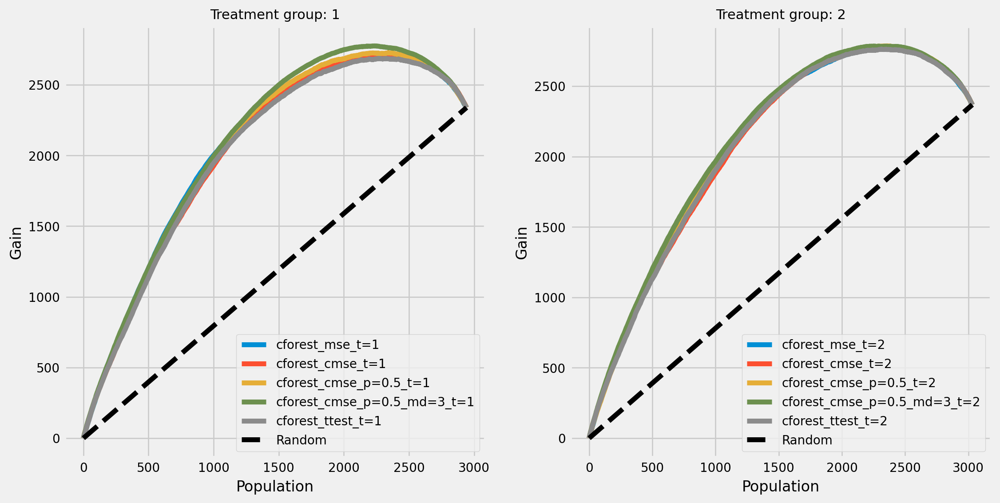

In [29]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in cforests.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)

#### The cumulative difference between the mean outcomes of the treatment and control groups in each population

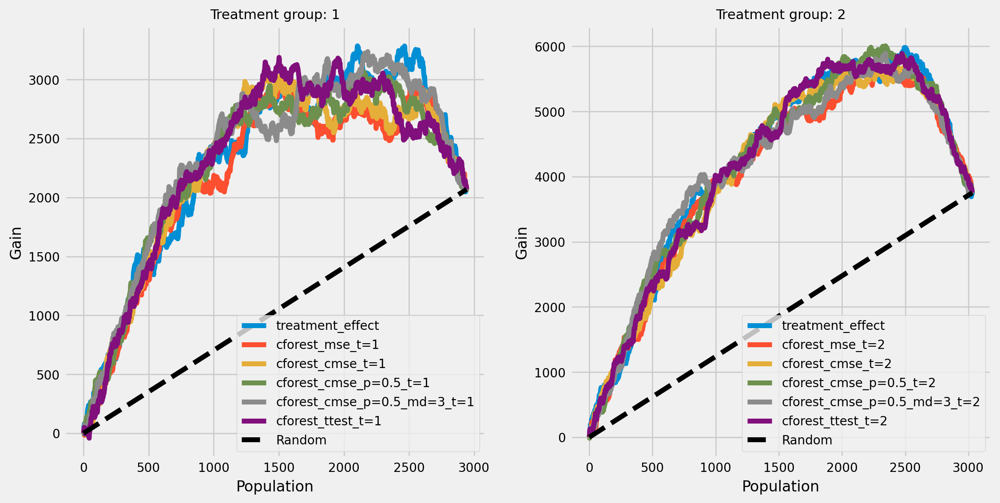

In [30]:
fig_height = 6
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in cforests.keys()]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)

###  Meta-Learner Algorithms

In [31]:
X_train = df_train[feature_names].values
X_test = df_test[feature_names].values

# learner - DecisionTreeRegressor
# treatment learner - LinearRegression()

meta_learners = {
    "learner_x": BaseXRegressor(learner=DecisionTreeRegressor(), 
                           treatment_effect_learner=LinearRegression()),
    "learner_s": BaseSRegressor(learner=DecisionTreeRegressor()),
    "learner_t": BaseTRegressor(learner=DecisionTreeRegressor(), 
                           treatment_learner=LinearRegression()),
    "learner_dr": BaseDRRegressor(learner=DecisionTreeRegressor(), 
                             treatment_effect_learner=LinearRegression())
}

for mlearner_name, mlearner in meta_learners.items():
    mlearner.fit(X=X_train, treatment=df_train['group'].values, y=df_train['outcome'].values)
    for tr_group in range(n_treatments):
        ite_preds = mlearner.predict(df_test[feature_names].values)
        df_result[f"{mlearner_name}_t={tr_group + 1}"] = ite_preds[:, tr_group]

In [32]:
cate_ctrees = [info['model'].predict(X) for _, info in ctrees.items()]
cate_cforests = [info['model'].predict(X) for _, info in cforests.items()]
cate_mlearners = [mlearner.predict(X) for _, mlearner in meta_learners.items() ]

model_cate = [*cate_ctrees, *cate_cforests, *cate_mlearners]
model_names = [*list(ctrees), *list(cforests), *list(meta_learners)]

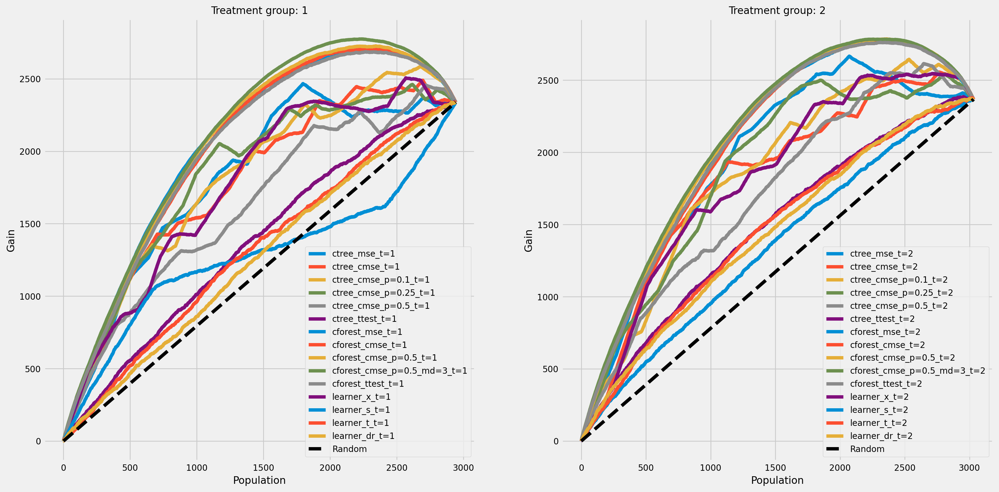

In [33]:
fig_height = 9
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in model_names]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=12)

In [34]:
rows, cols = 2, 7
row_idxs, col_idxs= np.arange(rows), np.arange(cols)
ax_idxs = np.dstack(np.meshgrid(col_idxs, row_idxs)).reshape(-1, 2) 

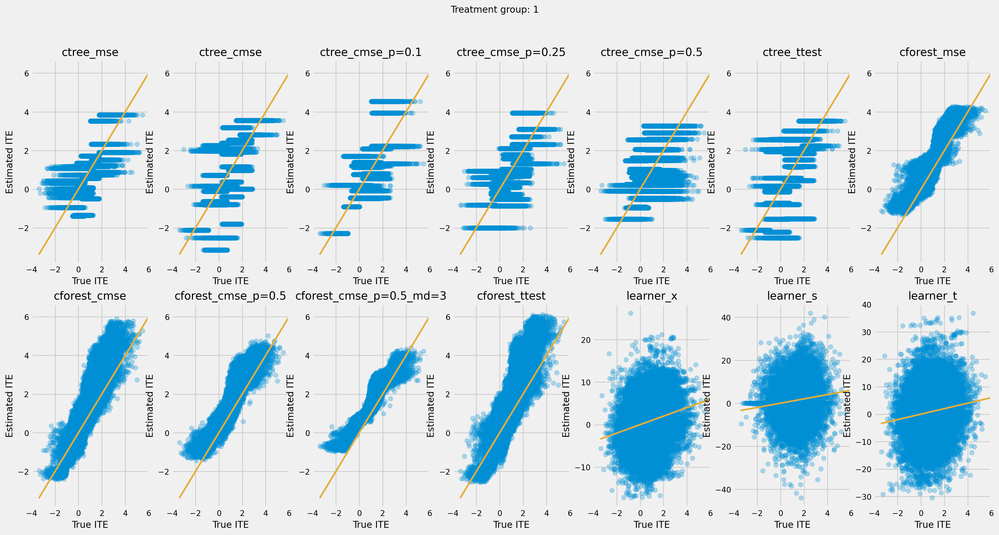

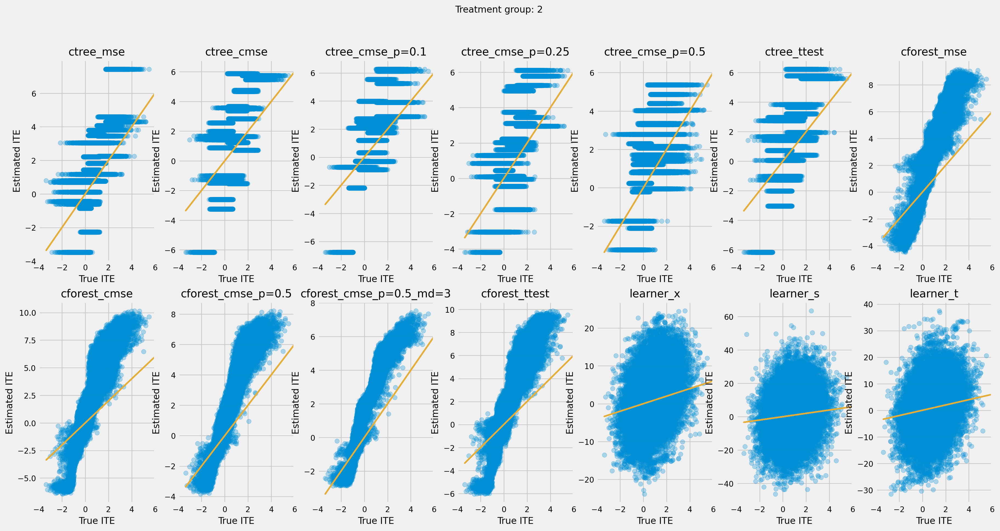

In [35]:
for i, group in enumerate(range(1, n_treatments + 1)):
    
    fig, ax = plt.subplots(rows, cols, figsize=(20, 10))
    plt.rcParams.update({'font.size': 10})
    
    for ax_idx, cate, model_name in zip(ax_idxs, model_cate, model_names):
        col_id, row_id = ax_idx
        cur_ax = ax[row_id, col_id]
        cur_ax.scatter(tau, cate[:, group-1], alpha=0.3)
        cur_ax.plot(tau, tau, color='C2', linewidth=2)
        cur_ax.set_xlabel('True ITE')
        cur_ax.set_ylabel('Estimated ITE')
        cur_ax.set_title(model_name)
        cur_ax.set_xlim((-4, 6))
    plt.suptitle(f"Treatment group: {group}", fontsize=12)

#### The cumulative difference between the mean outcomes of the treatment and control groups in each population

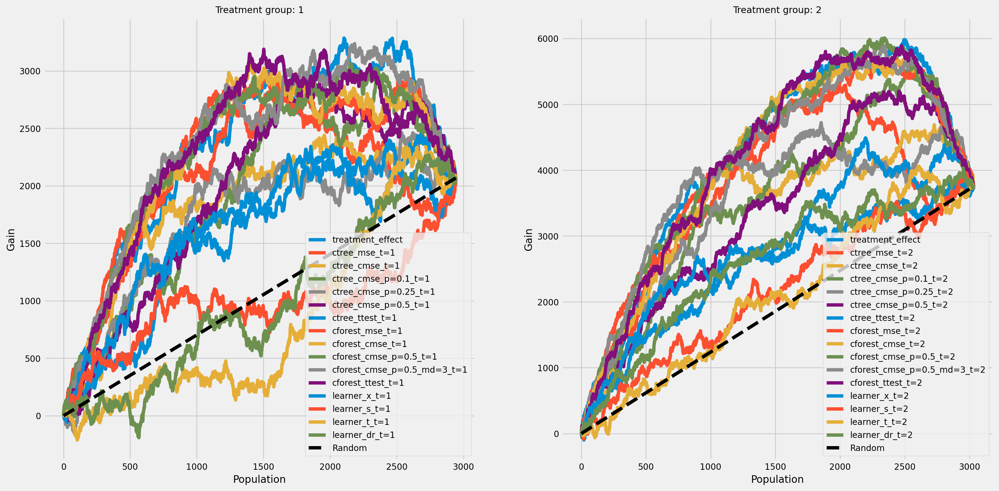

In [36]:
fig_height = 9
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in model_names]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_gain(df_group_result, 
              outcome_col='outcome', 
              treatment_col='is_treated',
              n = n_test,
              ax=axes[i]
             )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)

#### Qini chart

Text(0.5, 0.98, 'Qini charts for treatment groups')

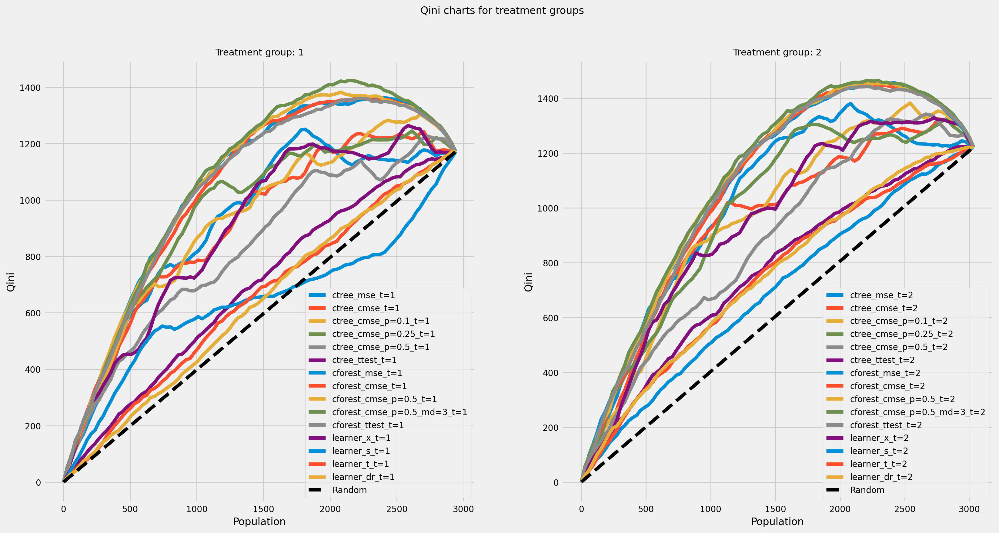

In [37]:
fig_height = 9
fig, axes = plt.subplots(nrows=1, ncols=n_treatments, figsize=(fig_height*n_treatments, fig_height))

for i, group in enumerate(range(1, n_treatments + 1)):
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in model_names]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    
    plot_qini(df_group_result,
              outcome_col='outcome', 
              treatment_col='is_treated',
              treatment_effect_col='treatment_effect',
              ax=axes[i]
    )
    axes[i].set_title(f"Treatment group: {group}", fontsize=11)
    
plt.suptitle("Qini charts for treatment groups")

In [38]:
qini_scores = []

for i, group in enumerate(range(1, n_treatments + 1)):
    
    df_group_result = df_result[df_result["group"].isin([0, group])]
    df_group_result["is_treated"] = (df_group_result["group"] == group).astype(int)
    ite_pred_cols_per_group = [f"{model_name}_t={group}" for model_name in model_names]
    df_group_result = df_group_result[["outcome", "is_treated", "treatment_effect", *ite_pred_cols_per_group]]
    df_qini = qini_score(df_group_result,
               outcome_col='outcome',
               treatment_col='is_treated',
               treatment_effect_col='treatment_effect')
    df_qini = df_qini.reset_index()
    df_qini.columns = ["model", "qini_score"]
    df_qini["group"] = group
    qini_scores.append(df_qini)

In [39]:
df_all_qini_scores = pd.concat(qini_scores, axis=0).sort_values(by=["qini_score"], ascending=False)
df_all_qini_scores

,model,qini_score,group
9,cforest_cmse_p=0.5_md=3_t=1,0.409017,1
8,cforest_cmse_p=0.5_t=1,0.397801,1
9,cforest_cmse_p=0.5_md=3_t=2,0.396630,2
6,cforest_mse_t=1,0.392532,1
8,cforest_cmse_p=0.5_t=2,0.386826,2
7,cforest_cmse_t=1,0.384581,1
10,cforest_ttest_t=1,0.382704,1
6,cforest_mse_t=2,0.381829,2
10,cforest_ttest_t=2,0.377605,2
7,cforest_cmse_t=2,0.377068,2


---

### Return outcomes along with estimated treatment effects

In [40]:
ctree_outcomes = ctrees["ctree_mse"]["model"].predict(X_test, with_outcomes=True)
cols = [*[f"Y{g}" for g in range(n_treatments+1)], *[f"ITE_t={tr_g}" for tr_g in range(1, n_treatments+1)]]
df_ctree_outcomes = pd.DataFrame(ctree_outcomes, columns=cols)
df_ctree_outcomes.head()

,Y0,Y1,Y2,ITE_t=1,ITE_t=2
0,-0.017305,2.304352,4.579000,2.321658,4.596306
1,2.935539,2.954345,3.732748,0.018806,0.797210
2,0.865992,0.374836,1.623489,-0.491156,0.757497
3,1.298560,-0.090058,0.440066,-1.388618,-0.858494
4,-0.638721,1.070378,1.191192,1.709099,1.829913


In [41]:
cforest_outcomes = cforests["cforest_mse"]["model"].predict(X_test, with_outcomes=True)
cols = [*[f"Y{g}" for g in range(n_treatments+1)], *[f"ITE_t={tr_g}" for tr_g in range(1, n_treatments+1)]]
df_cforest_outcomes = pd.DataFrame(cforest_outcomes, columns=cols)
df_cforest_outcomes.head()

,Y0,Y1,Y2,ITE_t=1,ITE_t=2
0,1.103392,4.327563,6.887289,3.224170,5.783897
1,2.583391,2.428633,2.131049,-0.154758,-0.452341
2,0.699538,1.987036,3.628007,1.287498,2.928469
3,0.959395,1.334843,1.758567,0.375448,0.799171
4,0.591521,2.335662,5.072632,1.744141,4.481111


### Bootstrap confidence intervals for individual treatment effects

In [42]:
alpha=0.05
tree = CausalTreeRegressor(criterion='causal_mse', control_name=0, min_samples_leaf=200, alpha=alpha)

In [43]:
# For time measurements
for n_jobs in (4, mp.cpu_count() - 1):
    for n_bootstraps in (10, 50, 100):
        print(f"n_jobs: {n_jobs} n_bootstraps: {n_bootstraps}" )
        tree.bootstrap_pool(
            X=X,
            treatment=w,
            y=y,
            n_bootstraps=n_bootstraps,
            bootstrap_size=10000,
            n_jobs=n_jobs,
            verbose=False
        )

n_jobs: 4 n_bootstraps: 10


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 17.74it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 10, 'bootstrap_size': 10000, 'n_jobs': 4, 'verbose': False} Elapsed time: 0.7314
n_jobs: 4 n_bootstraps: 50



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:03<00:00, 15.69it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 50, 'bootstrap_size': 10000, 'n_jobs': 4, 'verbose': False} Elapsed time: 3.3055
n_jobs: 4 n_bootstraps: 100



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:05<00:00, 19.89it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 100, 'bootstrap_size': 10000, 'n_jobs': 4, 'verbose': False} Elapsed time: 5.1517
n_jobs: 11 n_bootstraps: 10



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 23.11it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 10, 'bootstrap_size': 10000, 'n_jobs': 11, 'verbose': False} Elapsed time: 0.9184
n_jobs: 11 n_bootstraps: 50



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 50/50 [00:01<00:00, 30.44it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 50, 'bootstrap_size': 10000, 'n_jobs': 11, 'verbose': False} Elapsed time: 1.9200
n_jobs: 11 n_bootstraps: 100



100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 31.90it/s]

Function: bootstrap_pool Kwargs: {'n_bootstraps': 100, 'bootstrap_size': 10000, 'n_jobs': 11, 'verbose': False} Elapsed time: 3.4258


In [44]:
te, te_lower, te_upper = tree.fit_predict(
        X=df_train[feature_names].values,
        treatment=df_train["group"].values,
        y=df_train["outcome"].values,
        return_ci=True,
        n_bootstraps=500,
        bootstrap_size=5000,
        n_jobs=mp.cpu_count() - 1,
        verbose=False)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:08<00:00, 56.28it/s]


Function: bootstrap_pool Kwargs: {'n_bootstraps': 500, 'bootstrap_size': 5000, 'n_jobs': 11, 'verbose': False} Elapsed time: 9.1394


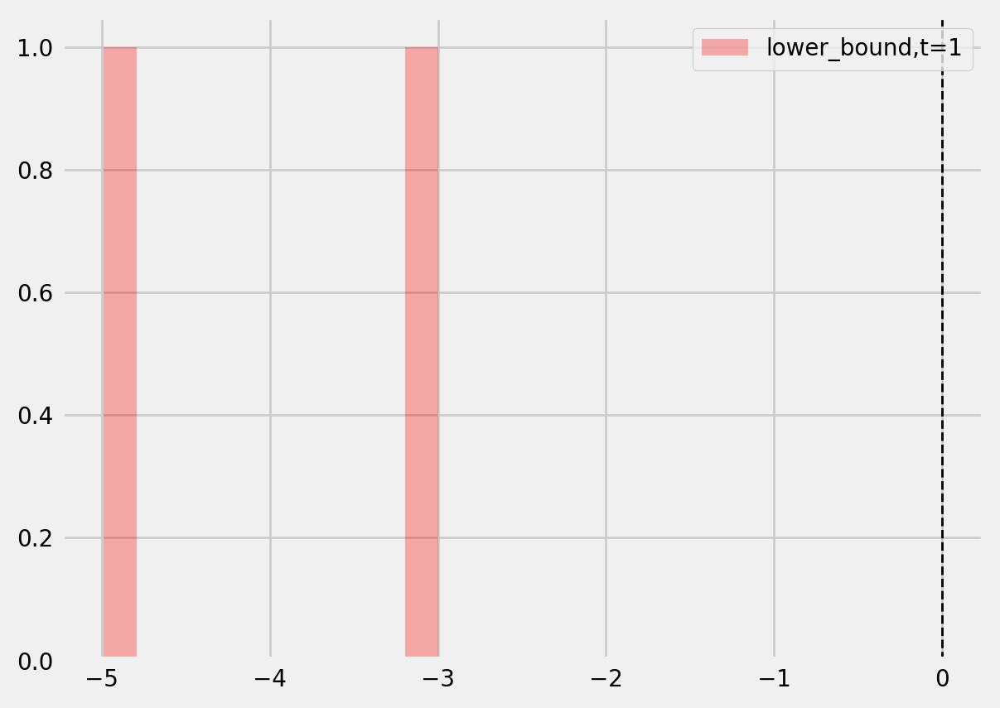

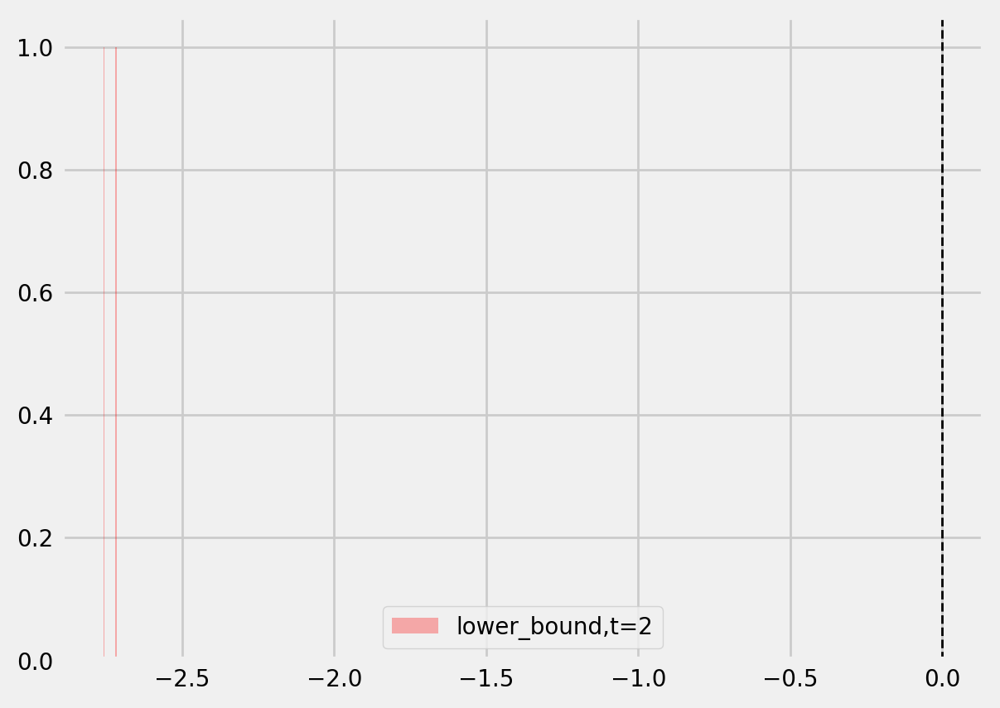

In [45]:
for group in range(1, n_treatments + 1):
    plt.hist(te_lower[group-1], color='red', alpha=0.3, label=f'lower_bound,t={group}')
    plt.axvline(x = 0, color = 'black', linestyle='--', lw=1, label='')
    plt.legend()
    plt.show()

In [46]:
# Significant estimates for negative and positive individual effects
# Default alpha = 0.05

bootstrap_neg = te[(te_lower < 0) & (te_upper < 0)]
bootstrap_pos = te[(te_lower > 0) & (te_upper > 0)]
print(bootstrap_neg.shape, bootstrap_pos.shape)

(0,) (5,)


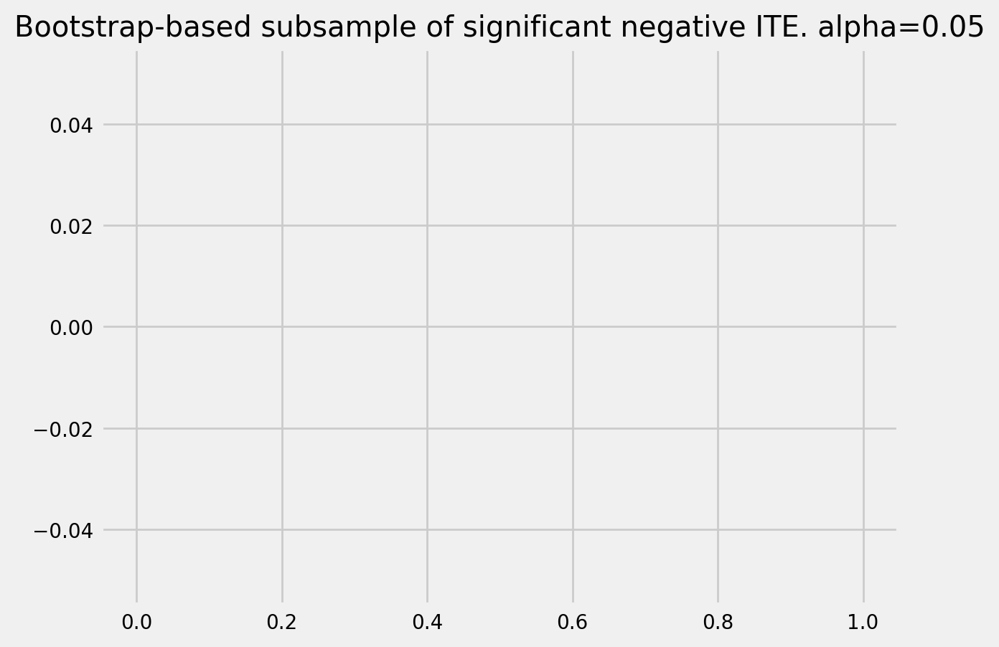

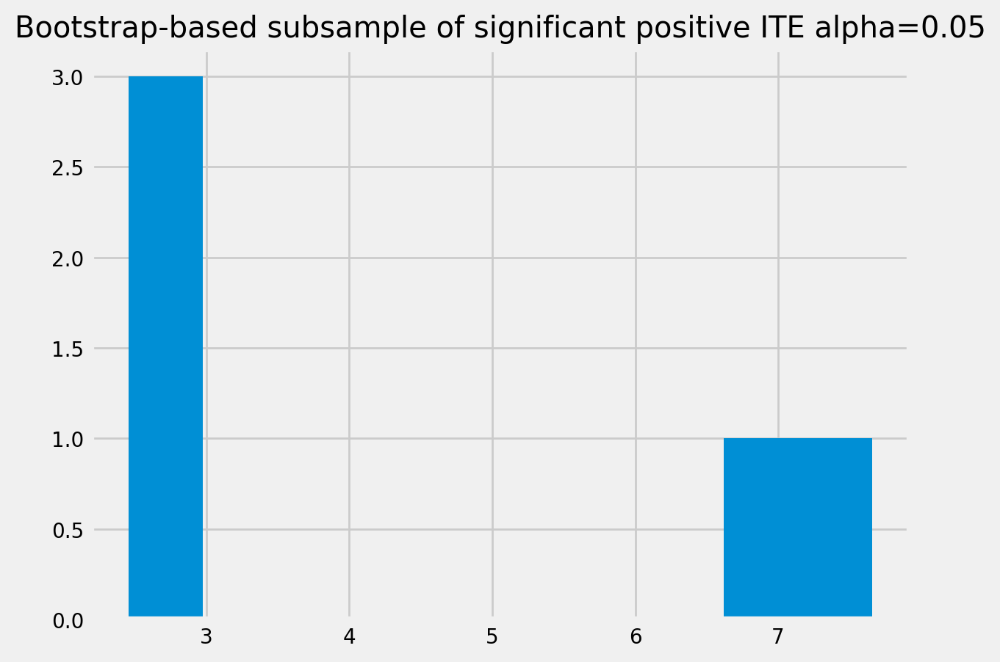

In [47]:
plt.hist(bootstrap_neg)
plt.title(f'Bootstrap-based subsample of significant negative ITE. alpha={alpha}')
plt.show()

plt.hist(bootstrap_pos)
plt.title(f'Bootstrap-based subsample of significant positive ITE alpha={alpha}')
plt.show()

### Average treatment effect

In [48]:
tree = CausalTreeRegressor(criterion='causal_mse', control_name=0, min_samples_leaf=200, alpha=alpha)
te, te_lb, te_ub = tree.estimate_ate(X=X, treatment=w, y=y)
print('ATE:', te, 'Bounds:', (te_lb, te_ub ), 'alpha:', alpha)

ATE: 1.2335129192949612 Bounds: (np.float64(1.2333649416843095), np.float64(1.2336608969056129)) alpha: 0.05
